<a href="https://colab.research.google.com/github/Simon-creator-jara/Inteligencia_artificial/blob/main/EDIFICIOS_GAN_pix2pix_Example.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# pix2pix: GAN condicional

Ejemplo tomado del tutorial: https://www.tensorflow.org/tutorials/generative/pix2pix

Acá construimos una red antagónica generativa condicional (cGAN, conditional generative adversarial network) llamada pix2pix. Esta es otra red de la gama de redes GAN, que aprende un mapeo de imágenes de entrada a imágenes de salida. 

pix2pix no es una aplicación específica: se puede aplicar a una amplia gama de tareas, incluida la síntesis de fotos a partir de mapas de etiquetas, la generación de fotos coloreadas a partir de imágenes en blanco y negro, la conversión de fotos de Google Maps en imágenes aéreas e incluso la transformación de bocetos en fotos.

En este ejemplo, su red generará imágenes de fachadas de edificios utilizando la base de datos de fachadas CMP proporcionada por el Centro de Percepción de Máquinas de la Universidad Técnica Checa en Praga . Para abreviar, utilizará una copia preprocesada de este conjunto de datos creado por los autores de pix2pix.

En pix2pix cGAN, usted condiciona las imágenes de entrada y genera las imágenes de salida correspondientes.

La arquitectura de su red contendrá:

*  Un generador con una arquitectura basada en U-Net .
*  Un discriminador representado por un clasificador PatchGAN convolucional (propuesto en el artículo de pix2pix ).

A continuación se muestran algunos ejemplos de la salida generada por pix2pix cGAN después de entrenar durante 100 épocas en el conjunto de datos de fachadas (pasos de 80k).


![sample output_1](https://www.tensorflow.org/images/gan/pix2pix_1.png)
![sample output_2](https://www.tensorflow.org/images/gan/pix2pix_2.png)

## Importar TensorFlow y otras bibliotecas

In [ ]:
import tensorflow as tf

import os
import pathlib
import time
import datetime

from matplotlib import pyplot as plt
from IPython import display

## Cargar la base de datos

Descargue los datos de la base de datos de fachadas de CMP (30 MB).

In [ ]:
_URL = 'http://efrosgans.eecs.berkeley.edu/pix2pix/datasets/cityscapes.tar.gz'

path_to_zip = tf.keras.utils.get_file(
    fname='cityscapes.tar.gz',
    origin=_URL,
    extract=True)

path_to_zip  = pathlib.Path(path_to_zip)


103456768/103441232 [==============================] - 113s 1us/step


In [ ]:
datset_name='cityscapes'
PATH = path_to_zip.parent/datset_name

In [ ]:
list(PATH.parent.iterdir())

[PosixPath('/root/.keras/datasets/cityscapes'),
 PosixPath('/root/.keras/datasets/cityscapes.tar.gz')]

Cada imagen original tiene un tamaño de 256 x 512 contiene dos imágenes de 256 x 256 

In [ ]:
sample_image = tf.io.read_file(str(PATH / 'train/1.jpg'))
sample_image = tf.io.decode_jpeg(sample_image)
print(sample_image.shape)

(256, 512, 3)


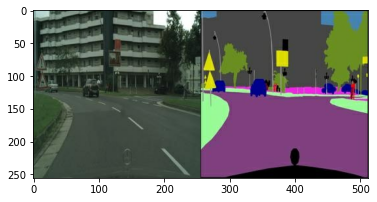

In [ ]:
plt.figure()
plt.imshow(sample_image)

Debe separar las imágenes de la fachada del edificio real de las imágenes de la etiqueta de arquitectura, todas las cuales tendrán un tamaño de 256 x 256 .

Defina una función que cargue archivos de imagen y genere dos tensores de imagen:

In [ ]:
def load(image_file):
  # Read and decode an image file to a uint8 tensor
  image = tf.io.read_file(image_file)
  image = tf.io.decode_jpeg(image)

  # Split each image tensor into two tensors:
  # - one with a real building facade image
  # - one with an architecture label image 
  w = tf.shape(image)[1]
  w = w // 2
  input_image = image[:, w:, :]
  real_image = image[:, :w, :]

  # Convert both images to float32 tensors
  input_image = tf.cast(input_image, tf.float32)
  real_image = tf.cast(real_image, tf.float32)

  return input_image, real_image

Trace una muestra de las imágenes de entrada (imagen de la etiqueta de arquitectura) y real (foto de la fachada del edificio):

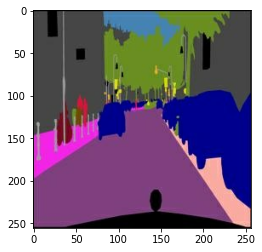

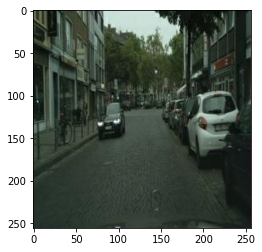

In [ ]:
inp, re = load(str(PATH / 'train/100.jpg'))
# Casting to int for matplotlib to display the images
plt.figure()
plt.imshow(inp / 255.0)
plt.figure()
plt.imshow(re / 255.0)

Se debe aplicar fluctuaciones y reflejos aleatorios para preprocesar el conjunto de entrenamiento.

Se van a definir varias funciones para:

* Cambiar el tamaño de cada imagen de 256 x 256 a una altura y un ancho mayores: 286 x 286 .
* Recortar aleatoriamente a 256 x 256 .
* Voltear aleatoriamente la imagen horizontalmente, es decir, de izquierda a derecha (espejo aleatorio).
* Normalizar las imágenes al rango [-1, 1] .

In [ ]:
# The facade training set consist of 400 images
BUFFER_SIZE = 400
# The batch size of 1 produced better results for the U-Net in the original pix2pix experiment
BATCH_SIZE = 1
# Each image is 256x256 in size
IMG_WIDTH = 256
IMG_HEIGHT = 256

In [ ]:
def resize(input_image, real_image, height, width):
  input_image = tf.image.resize(input_image, [height, width],
                                method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)
  real_image = tf.image.resize(real_image, [height, width],
                               method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)

  return input_image, real_image

In [ ]:
def random_crop(input_image, real_image):
  stacked_image = tf.stack([input_image, real_image], axis=0)
  cropped_image = tf.image.random_crop(
      stacked_image, size=[2, IMG_HEIGHT, IMG_WIDTH, 3])

  return cropped_image[0], cropped_image[1]

In [ ]:
# Normalizing the images to [-1, 1]
def normalize(input_image, real_image):
  input_image = (input_image / 127.5) - 1
  real_image = (real_image / 127.5) - 1

  return input_image, real_image

In [ ]:
@tf.function()
def random_jitter(input_image, real_image):
  # Resizing to 286x286
  input_image, real_image = resize(input_image, real_image, 286, 286)

  # Random cropping back to 256x256
  input_image, real_image = random_crop(input_image, real_image)

  if tf.random.uniform(()) > 0.5:
    # Random mirroring
    input_image = tf.image.flip_left_right(input_image)
    real_image = tf.image.flip_left_right(real_image)

  return input_image, real_image

Puede inspeccionar algunos de los resultados preprocesados:

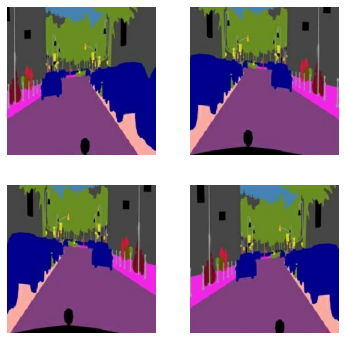

In [ ]:
plt.figure(figsize=(6, 6))
for i in range(4):
  rj_inp, rj_re = random_jitter(inp, re)
  plt.subplot(2, 2, i + 1)
  plt.imshow(rj_inp / 255.0)
  plt.axis('off')
plt.show()

Habiendo verificado que la carga y el preprocesamiento funcionan, definamos un par de funciones auxiliares que cargan y preprocesan los conjuntos de entrenamiento y prueba:

In [ ]:
def load_image_train(image_file):
  input_image, real_image = load(image_file)
  input_image, real_image = random_jitter(input_image, real_image)
  input_image, real_image = normalize(input_image, real_image)

  return input_image, real_image

In [ ]:
def load_image_test(image_file):
  input_image, real_image = load(image_file)
  input_image, real_image = resize(input_image, real_image,
                                   IMG_HEIGHT, IMG_WIDTH)
  input_image, real_image = normalize(input_image, real_image)

  return input_image, real_image

## Construir los datos de entrada con `tf.data`

In [ ]:
train_dataset = tf.data.Dataset.list_files(str(PATH / 'train/*.jpg'))
train_dataset = train_dataset.map(load_image_train,
                                  num_parallel_calls=tf.data.AUTOTUNE)
train_dataset = train_dataset.shuffle(BUFFER_SIZE)
train_dataset = train_dataset.batch(BATCH_SIZE)

In [ ]:
try:
  test_dataset = tf.data.Dataset.list_files(str(PATH / 'test/*.jpg'))
except tf.errors.InvalidArgumentError:
  test_dataset = tf.data.Dataset.list_files(str(PATH / 'val/*.jpg'))
test_dataset = test_dataset.map(load_image_test)
test_dataset = test_dataset.batch(BATCH_SIZE)

## Construye el generador

El generador de tu pix2pix cGAN es una red U-Net modificada.


Definir el downsampler (codificador):

In [ ]:
OUTPUT_CHANNELS = 3

In [ ]:
def downsample(filters, size, apply_batchnorm=True):
  initializer = tf.random_normal_initializer(0., 0.02)

  result = tf.keras.Sequential()
  result.add(
      tf.keras.layers.Conv2D(filters, size, strides=2, padding='same',
                             kernel_initializer=initializer, use_bias=False))

  if apply_batchnorm:
    result.add(tf.keras.layers.BatchNormalization())

  result.add(tf.keras.layers.LeakyReLU())

  return result

In [ ]:
down_model = downsample(3, 4)
down_result = down_model(tf.expand_dims(inp, 0))
print (down_result.shape)

(1, 128, 128, 3)


Definir el upsampler (decoder):

In [ ]:
def upsample(filters, size, apply_dropout=False):
  initializer = tf.random_normal_initializer(0., 0.02)

  result = tf.keras.Sequential()
  result.add(
    tf.keras.layers.Conv2DTranspose(filters, size, strides=2,
                                    padding='same',
                                    kernel_initializer=initializer,
                                    use_bias=False))

  result.add(tf.keras.layers.BatchNormalization())

  if apply_dropout:
      result.add(tf.keras.layers.Dropout(0.5))

  result.add(tf.keras.layers.ReLU())

  return result

In [ ]:
up_model = upsample(3, 4)
up_result = up_model(down_result)
print (up_result.shape)

(1, 256, 256, 3)


Defina el generador con el codificador y decodificador:

In [ ]:
def Generator():
  inputs = tf.keras.layers.Input(shape=[256, 256, 3])

  down_stack = [
    downsample(64, 4, apply_batchnorm=False),  # (batch_size, 128, 128, 64)
    downsample(128, 4),  # (batch_size, 64, 64, 128)
    downsample(256, 4),  # (batch_size, 32, 32, 256)
    downsample(512, 4),  # (batch_size, 16, 16, 512)
    downsample(512, 4),  # (batch_size, 8, 8, 512)
    downsample(512, 4),  # (batch_size, 4, 4, 512)
    downsample(512, 4),  # (batch_size, 2, 2, 512)
    downsample(512, 4),  # (batch_size, 1, 1, 512)
  ]

  up_stack = [
    upsample(512, 4, apply_dropout=True),  # (batch_size, 2, 2, 1024)
    upsample(512, 4, apply_dropout=True),  # (batch_size, 4, 4, 1024)
    upsample(512, 4, apply_dropout=True),  # (batch_size, 8, 8, 1024)
    upsample(512, 4),  # (batch_size, 16, 16, 1024)
    upsample(256, 4),  # (batch_size, 32, 32, 512)
    upsample(128, 4),  # (batch_size, 64, 64, 256)
    upsample(64, 4),  # (batch_size, 128, 128, 128)
  ]

  initializer = tf.random_normal_initializer(0., 0.02)
  last = tf.keras.layers.Conv2DTranspose(OUTPUT_CHANNELS, 4,
                                         strides=2,
                                         padding='same',
                                         kernel_initializer=initializer,
                                         activation='tanh')  # (batch_size, 256, 256, 3)

  x = inputs

  # Downsampling through the model
  skips = []
  for down in down_stack:
    x = down(x)
    skips.append(x)

  skips = reversed(skips[:-1])

  # Upsampling and establishing the skip connections
  for up, skip in zip(up_stack, skips):
    x = up(x)
    x = tf.keras.layers.Concatenate()([x, skip])

  x = last(x)

  return tf.keras.Model(inputs=inputs, outputs=x)

Visualice la arquitectura del modelo del generador:

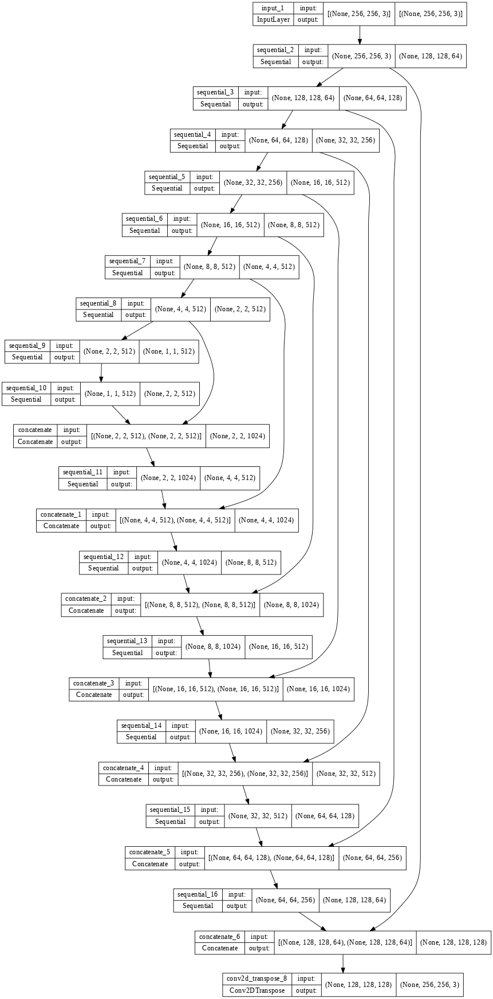

In [ ]:
generator = Generator()
tf.keras.utils.plot_model(generator, show_shapes=True, dpi=64)

Pruebe el generador:

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


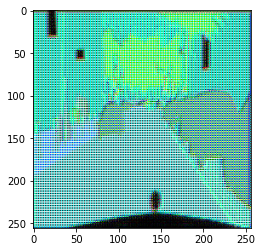

In [ ]:
gen_output = generator(inp[tf.newaxis, ...], training=False)
plt.imshow(gen_output[0, ...])

### Definir la pérdida del generador

Las GAN aprenden una pérdida que se adapta a los datos, mientras que las cGAN aprenden una pérdida estructurada que penaliza una posible estructura que difiere de la salida de la red y la imagen de destino, como se describe en el artículo de pix2pix .

La pérdida del generador es una pérdida de entropía cruzada sigmoidea de las imágenes generadas y una matriz de unos.

El artículo de pix2pix también menciona la pérdida L1, que es un MAE (error absoluto medio) entre la imagen generada y la imagen de destino.
Esto permite que la imagen generada se vuelva estructuralmente similar a la imagen de destino.
La fórmula para calcular la pérdida total del generador es gan_loss + LAMBDA * l1_loss , donde LAMBDA = 100 . Este valor fue decidido por los autores del artículo.

In [ ]:
LAMBDA = 100

In [ ]:
loss_object = tf.keras.losses.BinaryCrossentropy(from_logits=True)

In [ ]:
def generator_loss(disc_generated_output, gen_output, target):
  gan_loss = loss_object(tf.ones_like(disc_generated_output), disc_generated_output)

  # Mean absolute error
  l1_loss = tf.reduce_mean(tf.abs(target - gen_output))

  total_gen_loss = gan_loss + (LAMBDA * l1_loss)

  return total_gen_loss, gan_loss, l1_loss

El procedimiento de entrenamiento para el generador es el siguiente:

![Generator Update Image](https://github.com/tensorflow/docs/blob/master/site/en/tutorials/generative/images/gen.png?raw=1)


## Construye el discriminador

El discriminador en pix2pix cGAN es un clasificador PatchGAN convolucional: intenta clasificar si cada parche de imagen es real o no, como se describe en el artículo de pix2pix .

Cada bloque en el discriminador es: Convolución -> Normalización de lotes -> Leaky ReLU.
La forma de la salida después de la última capa es (batch_size, 30, 30, 1) .
Cada parche de imagen de 30 x 30 de la salida clasifica una porción de 70 x 70 de la imagen de entrada.
El discriminador recibe 2 entradas:
La imagen de entrada y la imagen de destino, que debe clasificar como real.
La imagen de entrada y la imagen generada (la salida del generador), que debe clasificar como falsa.
Use tf.concat([inp, tar], axis=-1) para concatenar estas 2 entradas juntas.


Definamos el discriminador:



In [ ]:
def Discriminator():
  initializer = tf.random_normal_initializer(0., 0.02)

  inp = tf.keras.layers.Input(shape=[256, 256, 3], name='input_image')
  tar = tf.keras.layers.Input(shape=[256, 256, 3], name='target_image')

  x = tf.keras.layers.concatenate([inp, tar])  # (batch_size, 256, 256, channels*2)

  down1 = downsample(64, 4, False)(x)  # (batch_size, 128, 128, 64)
  down2 = downsample(128, 4)(down1)  # (batch_size, 64, 64, 128)
  down3 = downsample(256, 4)(down2)  # (batch_size, 32, 32, 256)

  zero_pad1 = tf.keras.layers.ZeroPadding2D()(down3)  # (batch_size, 34, 34, 256)
  conv = tf.keras.layers.Conv2D(512, 4, strides=1,
                                kernel_initializer=initializer,
                                use_bias=False)(zero_pad1)  # (batch_size, 31, 31, 512)

  batchnorm1 = tf.keras.layers.BatchNormalization()(conv)

  leaky_relu = tf.keras.layers.LeakyReLU()(batchnorm1)

  zero_pad2 = tf.keras.layers.ZeroPadding2D()(leaky_relu)  # (batch_size, 33, 33, 512)

  last = tf.keras.layers.Conv2D(1, 4, strides=1,
                                kernel_initializer=initializer)(zero_pad2)  # (batch_size, 30, 30, 1)

  return tf.keras.Model(inputs=[inp, tar], outputs=last)

Visualizar la arquitectura del modelo discriminador:

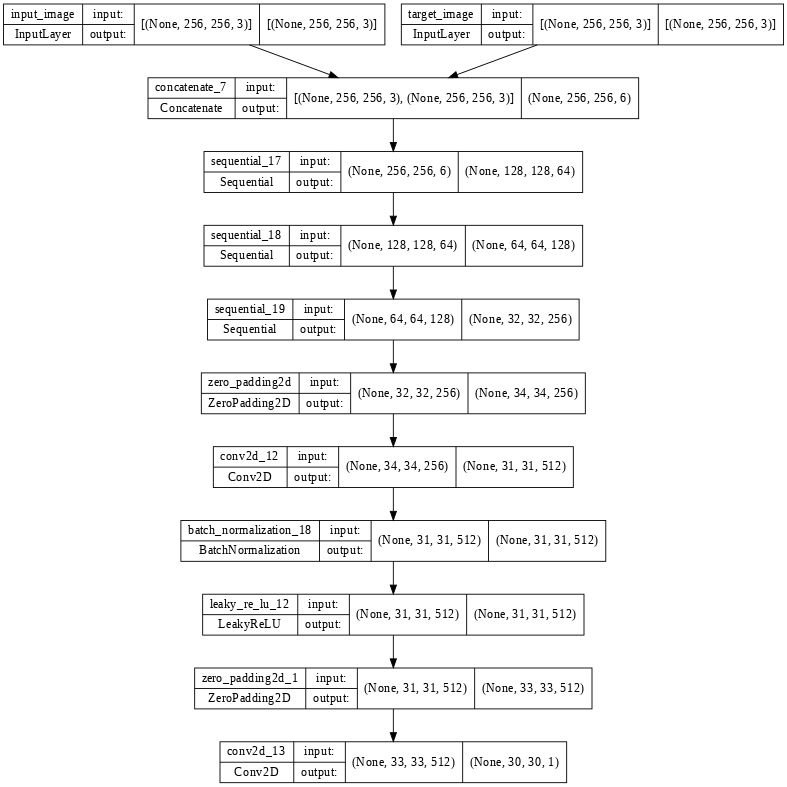

In [ ]:
discriminator = Discriminator()
tf.keras.utils.plot_model(discriminator, show_shapes=True, dpi=64)

Pruebe el discriminador:

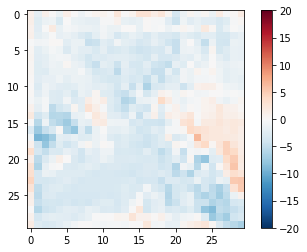

In [ ]:
disc_out = discriminator([inp[tf.newaxis, ...], gen_output], training=False)
plt.imshow(disc_out[0, ..., -1], vmin=-20, vmax=20, cmap='RdBu_r')
plt.colorbar()

### Definir la pérdida del discriminador
La función discriminator_loss toma 2 entradas: imágenes reales e imágenes generadas.

**real_loss** es una pérdida de entropía cruzada sigmoidea de las imágenes reales y una matriz de unas (ya que estas son las imágenes reales).

La pérdida** generated_loss** es una pérdida de entropía cruzada sigmoidea de las imágenes generadas y una matriz de ceros (ya que estas son las imágenes falsas).

La total_loss es la suma de la real_loss y la generated_loss .

In [ ]:
def discriminator_loss(disc_real_output, disc_generated_output):
  real_loss = loss_object(tf.ones_like(disc_real_output), disc_real_output)

  generated_loss = loss_object(tf.zeros_like(disc_generated_output), disc_generated_output)

  total_disc_loss = real_loss + generated_loss

  return total_disc_loss

l procedimiento de entrenamiento para el discriminador se muestra a continuación.

![Discriminator Update Image](https://github.com/tensorflow/docs/blob/master/site/en/tutorials/generative/images/dis.png?raw=1)


## Definir los optimizadores y un punto de control de ahorro


In [ ]:
generator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
discriminator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)

In [ ]:
checkpoint_dir = './training_checkpoints'
checkpoint_prefix = os.path.join(checkpoint_dir, "ckpt")
checkpoint = tf.train.Checkpoint(generator_optimizer=generator_optimizer,
                                 discriminator_optimizer=discriminator_optimizer,
                                 generator=generator,
                                 discriminator=discriminator)

## Generar imágenes

Escribe una función para trazar algunas imágenes durante el entrenamiento.

Pase imágenes del equipo de prueba al generador.
El generador luego traducirá la imagen de entrada a la salida.

El último paso es trazar las predicciones

In [ ]:
def generate_images(model, test_input, tar):
  prediction = model(test_input, training=True)
  plt.figure(figsize=(15, 15))

  display_list = [test_input[0], tar[0], prediction[0]]
  title = ['Input Image', 'Ground Truth', 'Predicted Image']

  for i in range(3):
    plt.subplot(1, 3, i+1)
    plt.title(title[i])
    # Getting the pixel values in the [0, 1] range to plot.
    plt.imshow(display_list[i] * 0.5 + 0.5)
    plt.axis('off')
  plt.show()

Prueba la función:

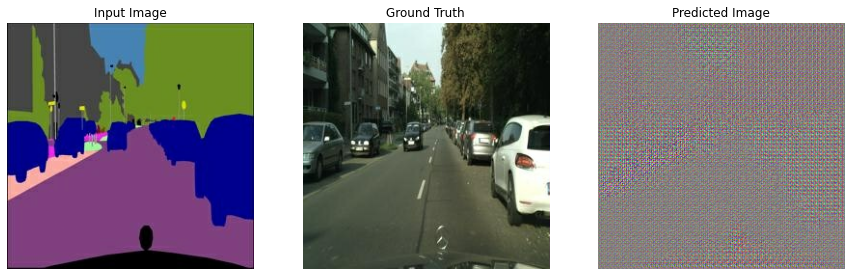

In [ ]:
for example_input, example_target in test_dataset.take(1):
  generate_images(generator, example_input, example_target)

## Entrenamiento

Para cada ejemplo, la entrada genera una salida.

El discriminador recibe input_image y la imagen generada como primera entrada. La segunda entrada es input_image y target_image.

A continuación, calcule el generador y la pérdida del discriminador.

Luego, calcule los gradientes de pérdida con respecto tanto al generador como a las variables discriminadoras (entradas) y aplíquelas al optimizador.

Finalmente, registre las pérdidas en TensorBoard.

In [ ]:
log_dir="logs/"

summary_writer = tf.summary.create_file_writer(
  log_dir + "fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))

In [ ]:
@tf.function
def train_step(input_image, target, step):
  with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
    gen_output = generator(input_image, training=True)

    disc_real_output = discriminator([input_image, target], training=True)
    disc_generated_output = discriminator([input_image, gen_output], training=True)

    gen_total_loss, gen_gan_loss, gen_l1_loss = generator_loss(disc_generated_output, gen_output, target)
    disc_loss = discriminator_loss(disc_real_output, disc_generated_output)

  generator_gradients = gen_tape.gradient(gen_total_loss,
                                          generator.trainable_variables)
  discriminator_gradients = disc_tape.gradient(disc_loss,
                                               discriminator.trainable_variables)

  generator_optimizer.apply_gradients(zip(generator_gradients,
                                          generator.trainable_variables))
  discriminator_optimizer.apply_gradients(zip(discriminator_gradients,
                                              discriminator.trainable_variables))

  with summary_writer.as_default():
    tf.summary.scalar('gen_total_loss', gen_total_loss, step=step//1000)
    tf.summary.scalar('gen_gan_loss', gen_gan_loss, step=step//1000)
    tf.summary.scalar('gen_l1_loss', gen_l1_loss, step=step//1000)
    tf.summary.scalar('disc_loss', disc_loss, step=step//1000)

El ciclo de entrenamiento real. Dado que este tutorial puede ejecutarse en más de un conjunto de datos, y los conjuntos de datos varían mucho en tamaño, el ciclo de entrenamiento está configurado para funcionar en pasos en lugar de épocas.

Itera sobre el número de pasos.

Cada 10 pasos imprime un punto ( . ).

Cada 1k pasos: borre la pantalla y ejecute generate_images para mostrar el progreso.

Cada 5k pasos: guarda un punto de control.

In [ ]:
def fit(train_ds, test_ds, steps):
  example_input, example_target = next(iter(test_ds.take(1)))
  start = time.time()

  for step, (input_image, target) in train_ds.repeat().take(steps).enumerate():
    if (step) % 1000 == 0:
      display.clear_output(wait=True)

      if step != 0:
        print(f'Paso 1000: {time.time()-start:.2f} segundos\n')

      start = time.time()

      generate_images(generator, example_input, example_target)
      print(f"Paso: {step//1000}k")

    train_step(input_image, target, step)

    # Paso de entrenamiento
    if (step+1) % 10 == 0:
      print('.', end='', flush=True)


    # Guardar modelo cada 5 pasos
    if (step + 1) % 5000 == 0:
      checkpoint.save(file_prefix=checkpoint_prefix)

Este ciclo de entrenamiento guarda registros que puedes ver en TensorBoard para monitorear el progreso del entrenamiento.

Si trabaja en una máquina local, iniciaría un proceso de TensorBoard por separado. Cuando trabaje en un cuaderno, inicie el visor antes de comenzar el entrenamiento para monitorear con TensorBoard.

Para iniciar el visor, pegue lo siguiente en una celda de código:

In [ ]:
%load_ext tensorboard
%tensorboard --logdir {log_dir}

<IPython.core.display.Javascript object>

Finalmente, ejecuta el ciclo de entrenamiento:

Paso 1000: 97.70 segundos



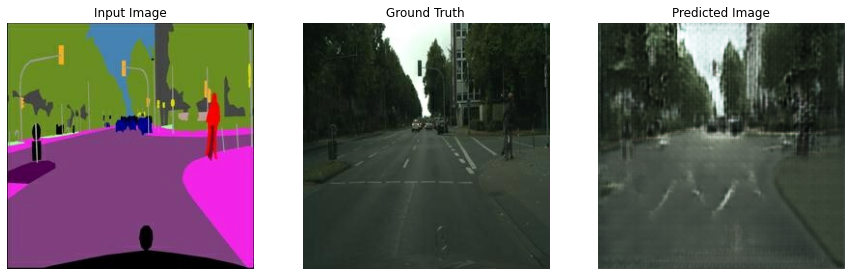

Paso: 6k
............................................

KeyboardInterrupt: ignored

In [ ]:
fit(train_dataset, test_dataset, steps=40000)

Si desea compartir los resultados de TensorBoard públicamente , puede cargar los registros en TensorBoard.dev copiando lo siguiente en una celda de código.
Nota: Esto requiere una cuenta de Google.

```
!tensorboard dev upload --logdir {log_dir}
```

**Precaución**: Este comando no termina. Está diseñado para cargar continuamente los resultados de experimentos de larga duración. Una vez que se cargan sus datos, debe detenerlos usando la opción "interrumpir ejecución" en su herramienta de cuaderno.

Puede ver los resultados de una ejecución anterior de este cuaderno en TensorBoard.dev.

TensorBoard.dev es una experiencia administrada para hospedar, rastrear y compartir experimentos de ML con todos.

También se puede incluir en línea usando un <iframe> :

In [ ]:
display.IFrame(
    src="https://tensorboard.dev/experiment/lZ0C6FONROaUMfjYkVyJqw",
    width="100%",
    height="1000px")

La interpretación de los registros es más sutil cuando se entrena una GAN (o una cGAN como pix2pix) en comparación con un modelo simple de clasificación o regresión. Cosas que buscar:

Compruebe que ni el generador ni el modelo discriminador han "ganado". Si gen_gan_loss o disc_loss muy bajos, es un indicador de que este modelo está dominando al otro y no está entrenando correctamente el modelo combinado.
El valor log(2) = 0.69 es un buen punto de referencia para estas pérdidas, ya que indica una perplejidad de 2: el discriminador, en promedio, tiene la misma incertidumbre sobre las dos opciones.
Para disc_loss , un valor por debajo de 0.69 significa que el discriminador lo está haciendo mejor que aleatorio en el conjunto combinado de imágenes reales y generadas.
Para gen_gan_loss , un valor por debajo de 0.69 significa que el generador lo está haciendo mejor que el azar para engañar al discriminador.
A medida que avanza el entrenamiento, gen_l1_loss debería disminuir.

## Restaurar el último punto de control y pruebe la red

In [ ]:
!ls {checkpoint_dir}

checkpoint  ckpt-1.data-00000-of-00001	ckpt-1.index


In [ ]:
# Restoring the latest checkpoint in checkpoint_dir
checkpoint.restore(tf.train.latest_checkpoint(checkpoint_dir))

## Genere algunas imágenes usando el conjunto de prueba

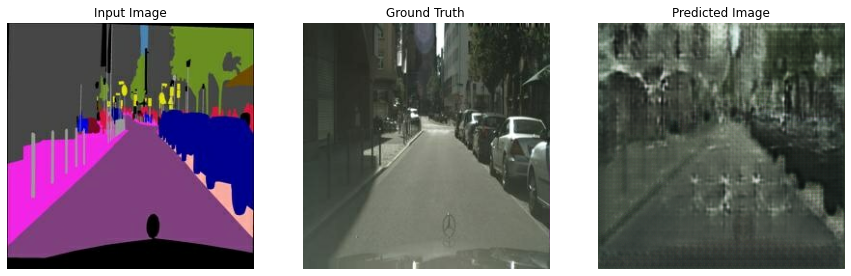

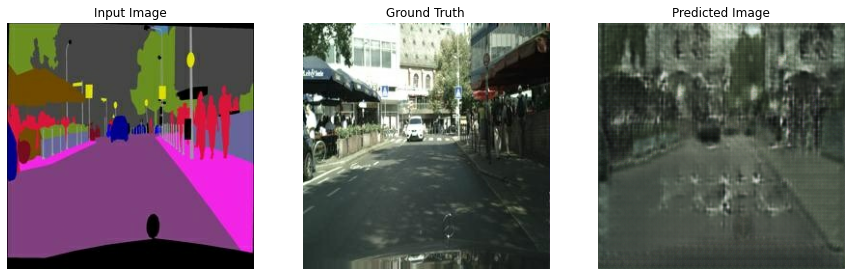

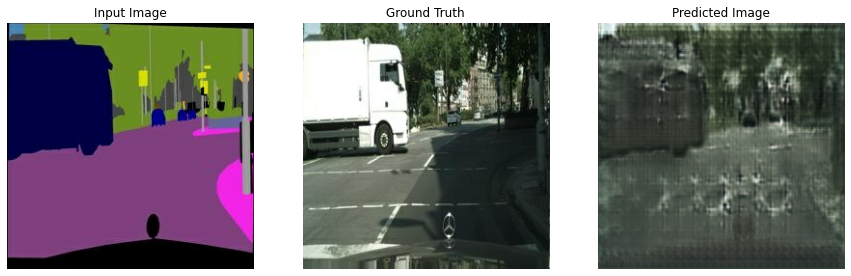

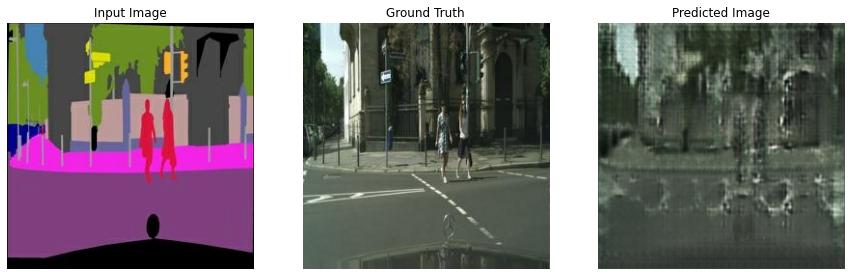

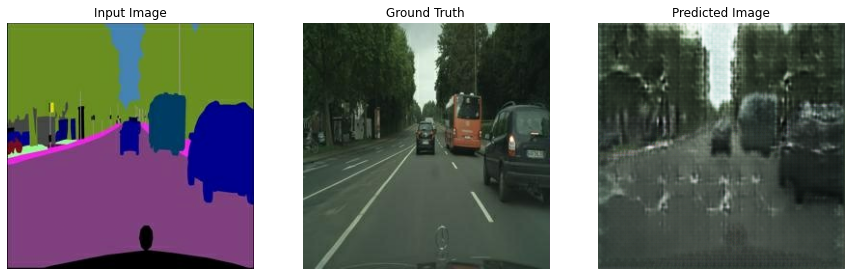

In [ ]:
# Run the trained model on a few examples from the test set
for inp, tar in test_dataset.take(5):
  generate_images(generator, inp, tar)